In [1]:
import dynamo as dyn
import pandas as pd
import numpy as np
import scipy
import scanpy as sc

import warnings
warnings.filterwarnings('ignore')

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


/Users/random/opt/anaconda3/envs/dynamo-dev/lib/python3.9/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.3 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.3, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [3]:
# JL_12_1_full = dyn.read('/lab/solexa_weissman/xqiu/proj/Aristotle/data/revision1/hsc/novaseq_sp_6_30/all_tags/count/adata.h5ad')

adata_dyn = dyn.read('./adata_dyn.h5ad')
adata_filtered = dyn.read('./adata_filtered_hsc.h5ad')

adata_dyn, adata_filtered

# klein_hsc_sc_analysis = dyn.read('./klein_hsc_sc_analysis.h5ad')

JL10_full = dyn.read('../nova_seq_7_15/all_tags/count_JL10_with_barcodes/adata.h5ad')
JL10_ntsu = dyn.read('./JL10_adata.h5ad')

JL12_2_full = dyn.read('../nova_seq_7_15/all_tags/count_JL12_with_barcodes/adata.h5ad')
JL12_2_ntsu = dyn.read('./JL12_2_filtered.h5ad')

# klein_hsc_sc_analysis.shape, 
JL10_full.shape, JL10_ntsu.shape, JL12_2_full.shape, JL12_2_ntsu.shape, adata_dyn.shape

|-----------> plotting with basis key=X_umap
|-----------> skip filtering batch by stack threshold when stacking color because it is not a numeric type


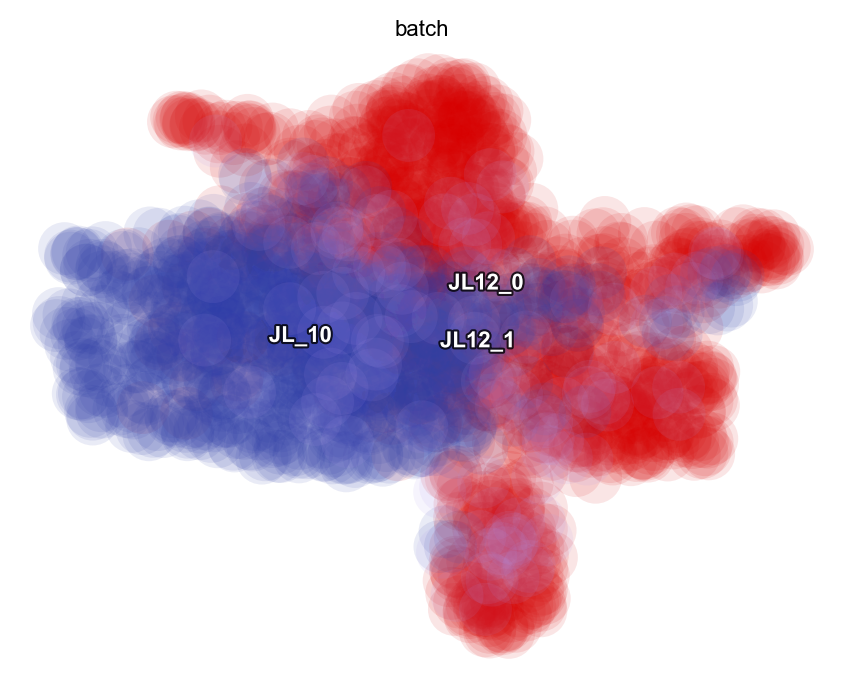

In [36]:
adata_filtered2_processed = dyn.read('./hsc_adata_filtered2.h5ad')

dyn.pl.scatters(adata_filtered2_processed, color='batch')

In [4]:
adata_dyn = dyn.read('./hsc_all_combined_all_layers.h5ad')

adata_dyn

AnnData object with n_obs × n_vars = 2019 × 26193
    obs: 'batch', 'time'
    var: 'gene_name', 'gene_id'
    layers: 'X_l_TC', 'X_n_TC', 'ambiguous', 'labeled_TC', 'sl_TC', 'sn_TC', 'spliced', 'total', 'ul_TC', 'un_TC', 'unlabeled_TC', 'unspliced'

In [5]:
adata_dyn.obs['time'] = 3
adata_dyn.obs.loc[adata_dyn.obs.batch == 'JL_10', 'time'] = 5
adata_dyn.obs.time.value_counts()

adata_dyn

AnnData object with n_obs × n_vars = 2019 × 26193
    obs: 'batch', 'time'
    var: 'gene_name', 'gene_id'
    layers: 'X_l_TC', 'X_n_TC', 'ambiguous', 'labeled_TC', 'sl_TC', 'sn_TC', 'spliced', 'total', 'ul_TC', 'un_TC', 'unlabeled_TC', 'unspliced'

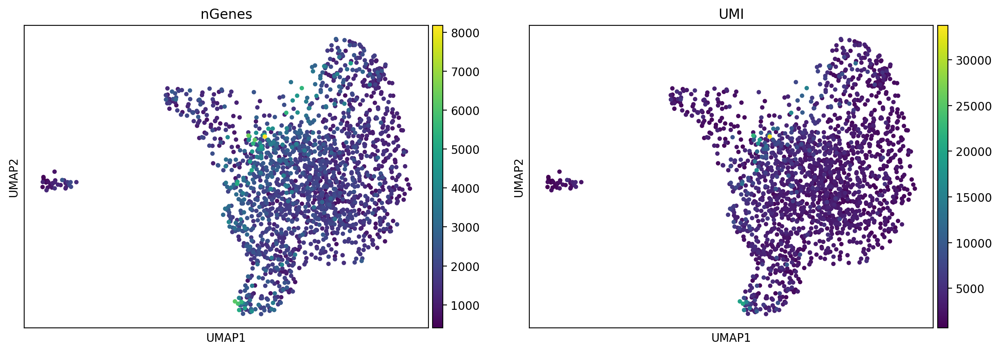

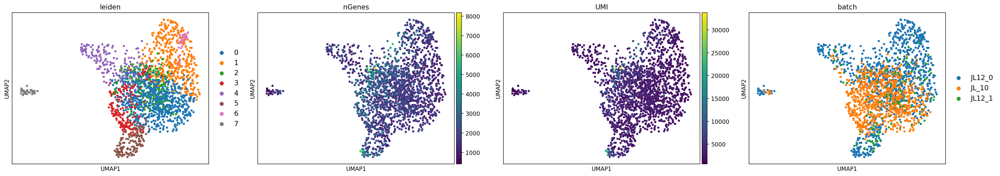

In [94]:
adata_dyn.obs_names_make_unique()
adata_filtered2 = adata_dyn.copy()
adata_filtered2.obs["nGenes"] = (adata_filtered2.X > 0).sum(1)
adata_filtered2.obs["UMI"] = (adata_filtered2.X).sum(1)

adata_filtered2.X = adata_filtered2.layers['labeled_TC'].copy()
adata_filtered2.X[adata_filtered2.obs.batch == 'JL_10', :] *= 3/5 
sc.pp.recipe_seurat(adata_filtered2)
# sc.pp.normalize_per_cell(adata_filtered2)
# sc.pp.log1p(adata_filtered2)
# sc.pp.scale(adata_filtered2)                              # scale to unit variance and shift to zero mean
sc.tl.pca(adata_filtered2, n_comps=50)

sc.pp.neighbors(adata_filtered2, n_neighbors=30, random_state=1, n_pcs=10)

sc.tl.leiden(adata_filtered2, resolution=0.5)
sc.tl.umap(adata_filtered2, random_state=1, n_components=3)

sc.pl.umap(adata_filtered2, color=['nGenes', 'UMI'])

adata_filtered2.obs.UMI.median(), adata_filtered2.obs.nGenes.median()

adata_filtered2

# plot results
sc.pl.umap(
    adata_filtered2,
    color=[
        "leiden",
        'nGenes', 
        'UMI',
        'batch',
    ],
    legend_fontsize="large",
    ncols=4,
)

# Vijay_genes = ["GFI1", "RUNX1", "IRF4", "IRF8", "SPI1", 'MPO']

# chen_paper_genes = ['PLEK', 'HBB', 'MPO', 'SPIB', 'CD79A', 'DNTT', 'CD34', 'CD164', 'LMO4', 'PF4', "LYZ", "PLEK", "MPO", "LMO4", "HBB"] + paul_Ery + Er
# sc.pl.umap(
#     adata_filtered2,
#     color=adata_filtered2.var_names.intersection(chen_paper_genes + Vijay_genes + ['leiden']),
#     ncols=4,
# )

adata_filtered2 = adata_filtered2[~ adata_filtered2.obs.leiden.isin(["7"])]

# adata_filtered2.write_h5ad("hsc_adata_filtered2.h5ad")

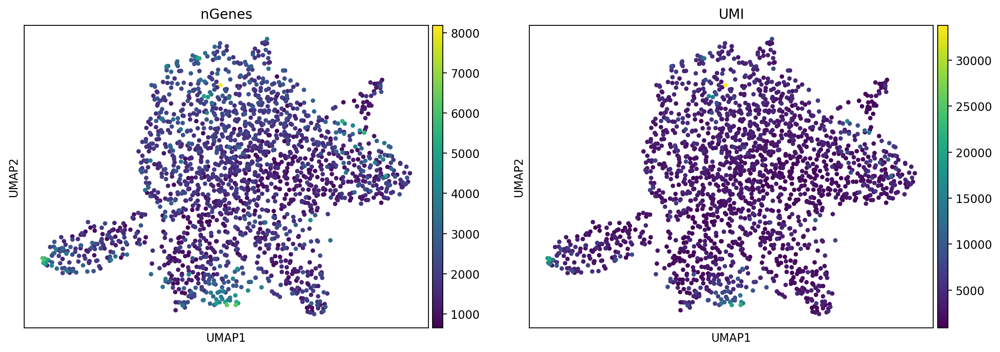

In [95]:
adata_filtered2 = adata_filtered2[~ adata_filtered2.obs.leiden.isin(["7"])]

sc.tl.umap(adata_filtered2, random_state=1, n_components=2)

sc.pl.umap(adata_filtered2, color=['nGenes', 'UMI'])

# adata_filtered2.write_h5ad("hsc_adata_filtered2.h5ad")

In [96]:
mapping_points  = adata_filtered2.obsm["X_umap"]

true_points  = adata_filtered2_processed.obsm["X_umap"]

In [97]:
mapping_points.shape, true_points.shape

((1947, 2), (1947, 2))

In [98]:
np.zeros(mapping_points.shape[0])

array([0., 0., 0., ..., 0., 0., 0.])

In [99]:
mapping_points = np.hstack([mapping_points, np.zeros(mapping_points.shape[0]).reshape(-1, 1)])

In [100]:
true_points = np.hstack([true_points, np.zeros(true_points.shape[0]).reshape(-1, 1)])

In [101]:
def kabsch_umeyama(A, B):
    assert A.shape == B.shape
    n, m = A.shape

    EA = np.mean(A, axis=0)
    EB = np.mean(B, axis=0)
    VarA = np.mean(np.linalg.norm(A - EA, axis=1) ** 2)

    H = ((A - EA).T @ (B - EB)) / n
    U, D, VT = np.linalg.svd(H)
    d = np.sign(np.linalg.det(U) * np.linalg.det(VT))
    S = np.diag([1] * (m - 1) + [d])

    R = U @ S @ VT
    c = VarA / np.trace(np.diag(D) @ S)
    t = EA - c * R @ EB

    return R, c, t

In [102]:
umap_transform = np.zeros_like(mapping_points)

for i in np.arange(umap_transform.shape[0]):
    umap_transform[i] = np.matmul(r, mapping_points[i])


In [111]:
R, c, t = kabsch_umeyama(true_points, mapping_points)
# R = [[-0.81034281,  0.58595608]
#      [-0.58595608, -0.81034281]]
# c = 1.46166131
# t = [271.3345951, 396.07800317]

umap_transform = np.array([t + c * R @ b for b in mapping_points])

In [112]:
R, c, t

(array([[ 0.17502694, -0.98456364,  0.        ],
        [ 0.98456364,  0.17502694,  0.        ],
        [ 0.        ,  0.        ,  1.        ]]),
 0.9949053365186171,
 array([16.21854168, -2.74087845,  0.        ]))

In [113]:
np.degrees(np.arccos(0.17502)), np.degrees(np.arcsin(0.98456364)) # , np.degrees(np.arccos(0.17502)), np.degrees(np.arccos(0.17502))

(79.9201780140905, 79.91977264054054)

In [114]:
umap_transform - true_points

array([[-0.19654616, -0.11811275,  0.        ],
       [-0.10217677, -0.16731384,  0.        ],
       [-0.12968242,  0.00525331,  0.        ],
       ...,
       [ 0.00972472, -0.0191353 ,  0.        ],
       [-0.32078807, -0.12213942,  0.        ],
       [-0.0258999 ,  0.02893525,  0.        ]])

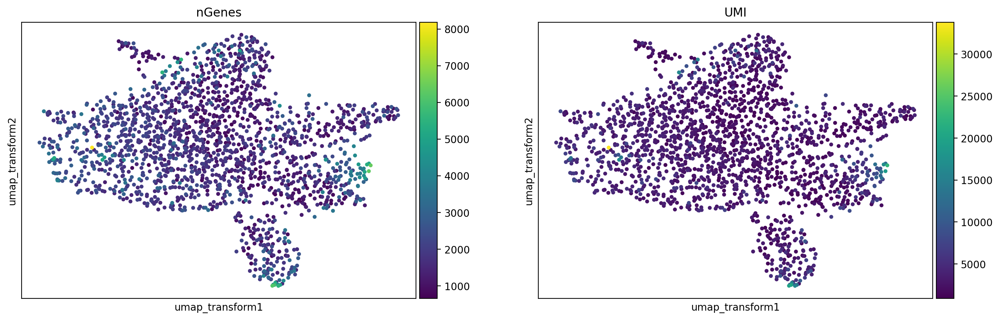

In [115]:
adata_filtered2.obsm['X_umap_transform'] = umap_transform[:, :2]

sc.pl.scatter(adata_filtered2, color=['nGenes', 'UMI'], basis='umap_transform')

In [116]:
adata_filtered2.obsm['X_umap'] = adata_filtered2_processed.obsm['X_umap'].copy()

In [88]:
import pickle 

union_genes = pickle.load(open('./union_genes.p', 'rb'))
# union_genes

In [89]:
adata_dyn.obs['time'] = 3
adata_dyn.obs.loc[adata_dyn.obs.batch == 'JL_10', 'time'] = 5
adata_labeling = adata_dyn[adata_filtered2.obs_names]

adata_labeling.X = adata_labeling.layers['total'].copy()
adata_labeling.layers['new'] = adata_labeling.layers['labeled_TC'].copy()

layers_keys = adata_labeling.layers.keys()
for i in ['X_l_TC', 'X_n_TC', 'ambiguous', 'labeled_TC', 'sl_TC', 'sn_TC', 'ul_TC', 'un_TC', 'unlabeled_TC', 'spliced', 'unspliced']:
    if i in layers_keys: del adata_labeling.layers[i]

dyn.pp.recipe_monocle(adata_labeling,
                      tkey='time',
                      experiment_type='one-shot',
                      genes_to_use=union_genes,
                      n_top_genes=len(union_genes),
                      feature_selection_layer='new',
                     )

dyn.tl.dynamics(adata_labeling, group='time' , one_shot_method='sci_fate', model='deterministic')
dyn.tl.reduceDimension(adata_labeling) 
dyn.tl.leiden(adata_labeling)
dyn.tl.cell_velocities(adata_labeling,
                       X=adata_labeling.layers['M_t'],
                       V=adata_labeling.layers['velocity_T'],
                       enforce=True,
                       method='cosine',
                       )

dyn.pl.streamline_plot(
    adata_labeling,
    color=['batch'] + list(adata_dyn.var_names.intersection(chen_paper_genes)),
    ncols=4,
    basis='umap',
    show_legend='best'
)

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----> detected experiment type: on

estimating alpha: 100%|██████████| 2543/2543 [00:00<00:00, 42178.06it/s]


|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [3.9100s]
|-----? Your adata only has labeling data, but `NTR_vel` is set to be `False`. Dynamo will reset it to `True` to enable this analysis.


estimating alpha: 100%|██████████| 2543/2543 [00:00<00:00, 46163.07it/s]


|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [20.7314s]
|-----> accessing adj_matrix_key=connectivities built from args for clustering...
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to networkx object
|-----> Detecting community with initial_membership input from ca

NameError: name 'chen_paper_genes' is not defined

In [123]:
adata_labeling.obsm['X_umap'] = adata_filtered2.obsm['X_umap'].copy()

|-----> accessing adj_matrix_key=X_umap_connectivities built from args for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to networkx object
|-----> Detecting community with initial_membership input from caller
|-----> [Community clustering with leiden] in progress: 100.0000%
|-----> [Community clustering with leiden] finished [181.3175s]
|-----> accessing adj_matrix_key=X_pca_connectivities built from args for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to networkx object
|-----> Detecting community with initial_membership input from caller
|-----> [Community clustering with leiden] in progress: 100.0000%
|-----> [Community clustering with leiden] finished [1.6705s]
|-----------> plotting with basis key=X_umap
|-----------> skip filtering umap_leiden by stack threshold when stacking color because it is not a numeric type
|-----------> skip filtering batch by stack threshold w

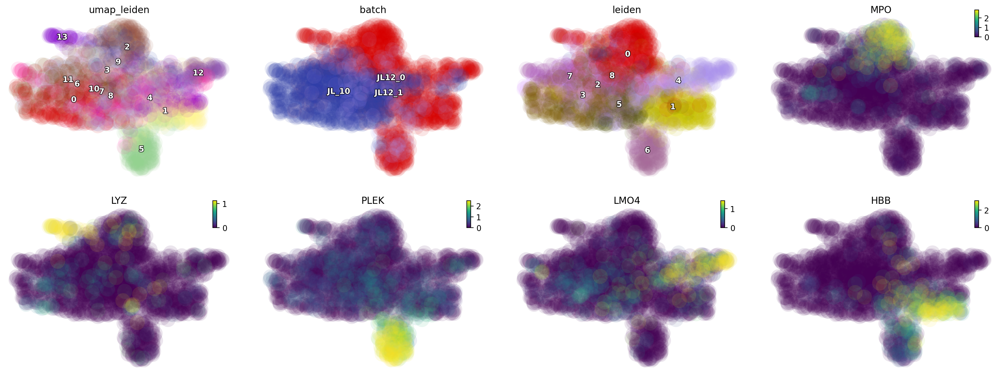

In [124]:
dynamo_revision_genes = ["LYZ", "PLEK", "MPO", "LMO4", "HBB"]

adata_labeling.obsm['X_pca'] = adata_filtered2.obsm['X_pca'].copy()
dyn.tl.leiden(adata_labeling, obsm_key='X_umap', result_key='umap_leiden')
dyn.tl.leiden(adata_labeling, obsm_key='X_pca')
dyn.pl.scatters(adata_labeling, color=['umap_leiden', 'batch', 'leiden'] + list(adata_dyn.var_names.intersection(dynamo_revision_genes)))

In [127]:
dyn.tl.neighbors(adata_labeling, basis='umap')

|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:umap
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.


AnnData object with n_obs × n_vars = 1947 × 26193
    obs: 'batch', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'total_Size_Factor', 'initial_total_cell_size', 'Size_Factor', 'initial_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'ntr', 'cell_cycle_phase', 'leiden', 'umap_leiden', 'umap_louvain'
    var: 'gene_name', 'gene_id', 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'frac', 'ntr', 'time_3_alpha', 'time_3_beta', 'time_3_gamma', 'time_3_half_life', 'time_3_alpha_b', 'time_3_alpha_r2', 'time_3_gamma_b', 'time_3_gamma_r2', 'time_3_gamma_logLL', 'time_3_delta_b', 'time_3_delta_r2', 'time_3_bs', 'time_3_bf', 'time_3_uu0', 'time_3_ul0', 'time_3_su0', 'time_3_sl0', 'time_3_U0', 'time_3_S0', 'time_3_total0', 'time_3_beta_k', 'time_3_gamma_k', 'time_5_alpha', 'time_5_beta', 'time_5_gamma', 'time_5_half_life', 'time_5_alpha_b', 'time_5_alpha_r2', 'time_5_gamma_b', 'time_5_gamma_r2', 'time_5_gamma_logLL', 'time_5_bs', 'time_5_bf', 'time_5_uu0', 'time_5_ul

|-----> accessing adj_matrix_key=X_umap_connectivities built from args for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to networkx object
|-----> [Community clustering with louvain] in progress: 100.0000%
|-----> [Community clustering with louvain] finished [45.5556s]
|-----------> plotting with basis key=X_umap
|-----------> skip filtering umap_leiden by stack threshold when stacking color because it is not a numeric type
|-----------> skip filtering batch by stack threshold when stacking color because it is not a numeric type
|-----------> skip filtering umap_louvain by stack threshold when stacking color because it is not a numeric type


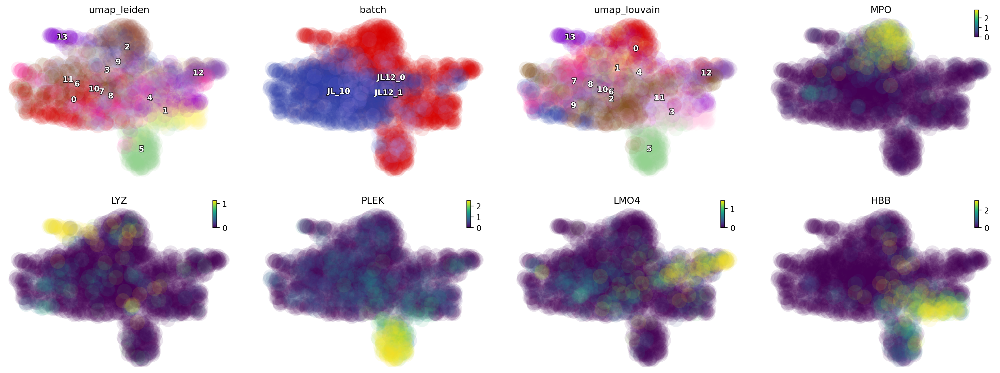

In [129]:
dyn.tl.louvain(adata_labeling, obsm_key='X_umap', result_key='umap_louvain', adj_matrix_key='X_umap_connectivities')
dyn.pl.scatters(adata_labeling, color=['umap_leiden', 'batch', 'umap_louvain'] + list(adata_dyn.var_names.intersection(dynamo_revision_genes)))

|-----> using adj_matrix passed from arg for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to networkx object
|-----> [Community clustering with louvain] in progress: 100.0000%
|-----> [Community clustering with louvain] finished [21.6305s]
|-----------> plotting with basis key=X_umap
|-----------> skip filtering batch by stack threshold when stacking color because it is not a numeric type
|-----------> skip filtering umap_louvain by stack threshold when stacking color because it is not a numeric type


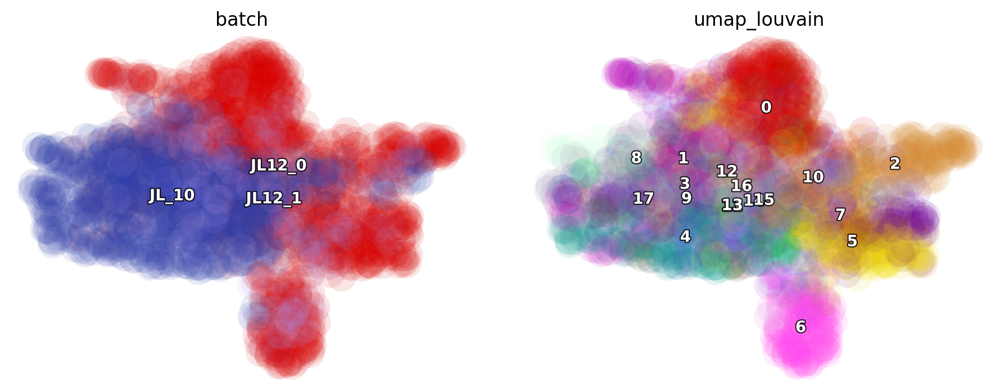

In [139]:
dyn.tl.louvain(adata_labeling, obsm_key='X_umap', result_key='umap_louvain', resolution=0.7, adj_matrix=adata_labeling.obsp['X_pca_connectivities'])
dyn.pl.scatters(adata_labeling, color=['batch', 'umap_louvain'])

In [ ]:
adata_labeling.obs['cell_type'] = adata_labeling.obs['umap_louvain'].map({
    "3": "HSC",
    "12": "HSC",
    "7": "GMP",
    "11": "GMP",
    "2": 'MPP',
    "8": "MPP",
    "10": "MPP",
    "9": "Neu",
    "6": "Mon",
    "4": "Mon",
    "0": "Bas",
    "1": "Ery",
    "5": "Meg",
})

dyn.pl.streamline_plot(adata_labeling, color='cell_type')

In [2]:
################################### Our data ###################################
adata_dyn = dyn.read('./hsc_all_combined_all_layers.h5ad')
adata_filtered2 = dyn.read('./hsc_adata_filtered2.h5ad')
adata_dyn.obs['time'] = 3
adata_dyn.obs.loc[adata_dyn.obs.batch == 'JL_10', 'time'] = 5
adata_labeling = adata_dyn[adata_filtered2.obs_names]

adata_labeling.layers['new'] = adata_labeling.layers['labeled_TC'].copy()

# adata_labeling.X = adata_labeling.layers['labeled_TC'].copy()
# adata_labeling.X[adata_labeling.obs.batch == 'JL_10', :] *= 3/5 

layers_keys = adata_labeling.layers.keys()
for i in ['X_l_TC', 'X_n_TC', 'ambiguous', 'labeled_TC', 'sl_TC', 'sn_TC', 'ul_TC', 'un_TC', 'unlabeled_TC']:
    if i in layers_keys: del adata_labeling.layers[i]

import pickle
union_genes = pickle.load(open('./union_genes.p', 'rb'))

In [3]:
# ZFPM1: FOG1; EKLF: KLF1; cJun: JUN; EgrNab: NAB2
# ETO2: CBFA2T3; TEL: ETV6 
network_inference_genes = ["GATA2", "GFI1", "GFI1B", "NFE2", "TAL1", "GATA1", "LYL1", "ERG", "FLI1", "MEIS1", "SPI1", "MITF", "LMO2", "LDB1", "RUNX1", "ETV6", "HHEX", "CBFA2T3"]
Krumsiek_11 = ["GATA2", "GATA1", "ZFPM1", "SPI1", "FLI1", "KLF1", "TAL1", "CEBPA", "GFI1", "JUN", "NAB2"]

union_genes += network_inference_genes
union_genes += Krumsiek_11

In [4]:
len(np.unique(union_genes)), len(union_genes)

(2552, 2574)

In [5]:
adata_labeling_obs = pd.read_csv('adata_labeling_all_combined_processed_final.csv', index_col=0)

adata_labeling_obs.head()

,batch,time,cell_type,nGenes,nCounts,pMito,pass_basic_filter,new_Size_Factor,initial_new_cell_size,total_Size_Factor,...,pca_ddhodge_potential,umap_ori_ddhodge_div,umap_ori_ddhodge_potential,curl_umap_ori,divergence_umap_ori,control_point_umap_ori,inlier_prob_umap_ori,obs_vf_angle_umap_ori,n_counts,mt_frac
barcode,,,,,,,,,,,,,,,,,,,,,
CCACAAGCGTGC-JL12_0,JL12_0,3,Mon,1196,1944.0,0.114198,True,1.039024,852.0,1.227772,...,0.507833,-16.341991,1.792488,-0.046206,0.112111,False,0.999549,0.176351,3466.0,0.073572
CCATCCTGTGGA-JL12_0,JL12_0,3,Meg,1172,1706.0,0.067995,True,0.506098,415.0,1.002834,...,4.700147,41.514399,3.392540,0.098062,-0.273977,False,0.860345,0.354914,2831.0,0.048746
CCCTCGGCCGCA-JL12_0,JL12_0,3,Mon,663,915.0,0.044809,True,0.507317,416.0,0.718030,...,0.659788,-10.063857,1.593789,-0.017185,0.040728,False,0.999324,-0.352141,2027.0,0.024667
CCGCCCACCATG-JL12_0,JL12_0,3,Mon,2349,4739.0,0.138637,True,3.087805,2532.0,3.222813,...,0.609316,-15.608460,1.580450,0.110991,0.144292,False,0.999277,-0.449798,9098.0,0.086942
CCGCTGTGTAAG-JL12_0,JL12_0,3,MPP,1365,2140.0,0.077103,True,1.018293,835.0,1.231669,...,0.526728,-4.605920,1.269363,-0.040901,0.104698,False,0.999717,0.006409,3477.0,0.057521


In [8]:
adata_labeling = adata_labeling[adata_labeling_obs.index]
adata_labeling.obs['cell_type'] = list(adata_labeling_obs.loc[adata_labeling.obs_names, "cell_type"])

In [9]:
adata_labeling.obs['cell_type'].unique()

array(['Mon', 'Meg', 'MPP', 'Ery', 'Bas', 'GMP', 'HSC', 'Neu'],
      dtype=object)

In [10]:
adata_labeling.obs['cell_type'] = adata_labeling.obs['cell_type'].map({
    "GMP": "GMP-like",
    "MPP": "MEP-like",
    'Mon': "Mon", 
    'Meg': "Meg", 
    'Ery': "Ery", 
    'Bas': "Bas", 
    'HSC': "HSC", 
    'Neu': "Neu"
})

adata_labeling.obs['cell_type'].value_counts()

MEP-like    457
Mon         423
HSC         309
Ery         234
Bas         177
GMP-like    161
Meg         154
Neu          32
Name: cell_type, dtype: int64

In [11]:
adata_labeling

AnnData object with n_obs × n_vars = 1947 × 26193
    obs: 'batch', 'time', 'cell_type'
    var: 'gene_name'
    layers: 'spliced', 'total', 'unspliced', 'new'

In [12]:
dyn.pp.recipe_monocle(adata_labeling,
                      tkey='time',
                      experiment_type='one-shot',
                      genes_to_use=union_genes,
                      n_top_genes=len(union_genes), 
                      maintain_n_top_genes=True
                     )
adata_labeling.var.use_for_pca.sum()

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> convert ensemble name to official gene name
|-----? Your adata object uses non-official gene names as gene index. 
Dynamo is converting those names to official gene names.
|-----> Storing myGene name info into local cache db: mygene_cache.sqlite.
[ Future queries will be cached in "/Users/random/dynamo-notebooks/dynamo-hsc-process/mygene_cache.sqlite" ]
querying 1-1000...done. [ from cache ]
querying 1001-2000...done. [ from cache ]
querying 2001-3000...done. [ from cache ]
querying 3001-4000...done. [ from cache ]
query

1766

In [13]:
list(set(Krumsiek_11 + network_inference_genes).difference(adata_labeling.var_names[adata_labeling.var.use_for_pca]))

[]

In [14]:
list(set(Krumsiek_11 + network_inference_genes).intersection(adata_labeling.var_names[adata_labeling.var.use_for_pca]))

['NFE2',
 'TAL1',
 'HHEX',
 'MITF',
 'GATA1',
 'GATA2',
 'CEBPA',
 'JUN',
 'FLI1',
 'LDB1',
 'ZFPM1',
 'LMO2',
 'LYL1',
 'ERG',
 'KLF1',
 'GFI1B',
 'MEIS1',
 'ETV6',
 'RUNX1',
 'GFI1',
 'NAB2',
 'SPI1',
 'CBFA2T3']

|-----> calculating first/second moments...


OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [14.2199s]
|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [8.4075s]
|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [3.3919s]
|-----? Your adata only has labeling data, but `NTR_vel` is set to be `False`. Dynamo will reset it to `True` to enable this analysis.


estimating alpha: 100%|██████████| 1766/1766 [00:00<00:00, 68944.68it/s]


|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [2.2858s]
|-----? Your adata only has labeling data, but `NTR_vel` is set to be `False`. Dynamo will reset it to `True` to enable this analysis.


estimating alpha: 100%|██████████| 1766/1766 [00:00<00:00, 69514.07it/s]


|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [13.1243s]
|-----> accessing adj_matrix_key=connectivities built from args for clustering...
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.
|-----> Detecting communities on graph...
Note: to be able to use all crisp methods, you need to install some additional packages:  {'graph_tool', 'infomap'}


Note: to be able to use all overlapping methods, you need to install some additional packages:  {'ASLPAw'}
Note: to be able to use all bipartite methods, you need to install some additional packages:  {'infomap'}
|-----------> Converting graph_sparse_matrix to networkx object
|-----> Detecting community with initial_membership input from caller
|-----> [Community clustering with leiden] in progress: 100.0000%
|-----> [Community clustering with leiden] finished [147.9272s]
|-----> 0 genes are removed because of nan velocity values.
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] finished [8.4486s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.4904s]
|-----------> plotting with basis key=X_umap
|-----------> skip filtering batch by stack 

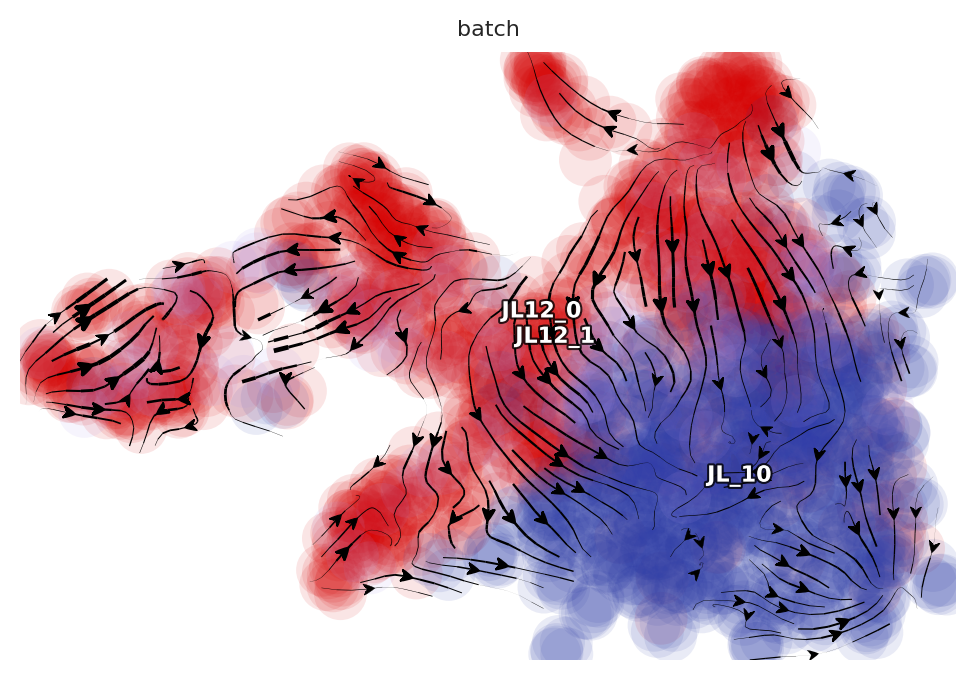

In [15]:
dyn.tl.moments(adata_labeling, group='time')
M_s = adata_labeling.layers['M_s'].copy()
M_u = adata_labeling.layers['M_u'].copy()

# here delete the splicing data
adata_full = adata_labeling.copy()
layers_keys = adata_labeling.layers.keys()
for i in ['spliced', 'unspliced', 'X_spliced', 'X_unspliced',  'M_u', 'M_uu', 'M_s', 'M_us', 'M_t', 'M_tt', 'M_n', 'M_tn', 'M_ss', 'M_nn']:
    if i in layers_keys: del adata_labeling.layers[i]
adata_labeling.uns['pp']
adata_labeling.uns['pp']['has_splicing'] = False

dyn.tl.dynamics(adata_labeling, group='time', one_shot_method='sci_fate', model='deterministic')
dyn.tl.reduceDimension(adata_labeling)
dyn.tl.leiden(adata_labeling)
dyn.tl.cell_velocities(adata_labeling,
                       enforce=True,
                       method='cosine',
                       )

dyn.pl.streamline_plot(
    adata_labeling,
    color=['batch'], #+ list(adata_dyn.var_names.intersection(chen_paper_genes)),
    ncols=4,
    basis='umap',
)

In [16]:
adata_labeling.uns['pp']

{'has_splicing': False,
 'has_labeling': True,
 'splicing_labeling': False,
 'has_protein': False,
 'tkey': 'time',
 'experiment_type': 'one-shot',
 'norm_method': None}

In [17]:
adata_labeling.obs.time.unique()

array([3, 5])

|-----> 0 genes are removed because of nan velocity values.
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via cosine kernel with sqrt transform.] finished [136.5566s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.4066s]
|-----------> plotting with basis key=X_umap
|-----------> skip filtering batch by stack threshold when stacking color because it is not a numeric type


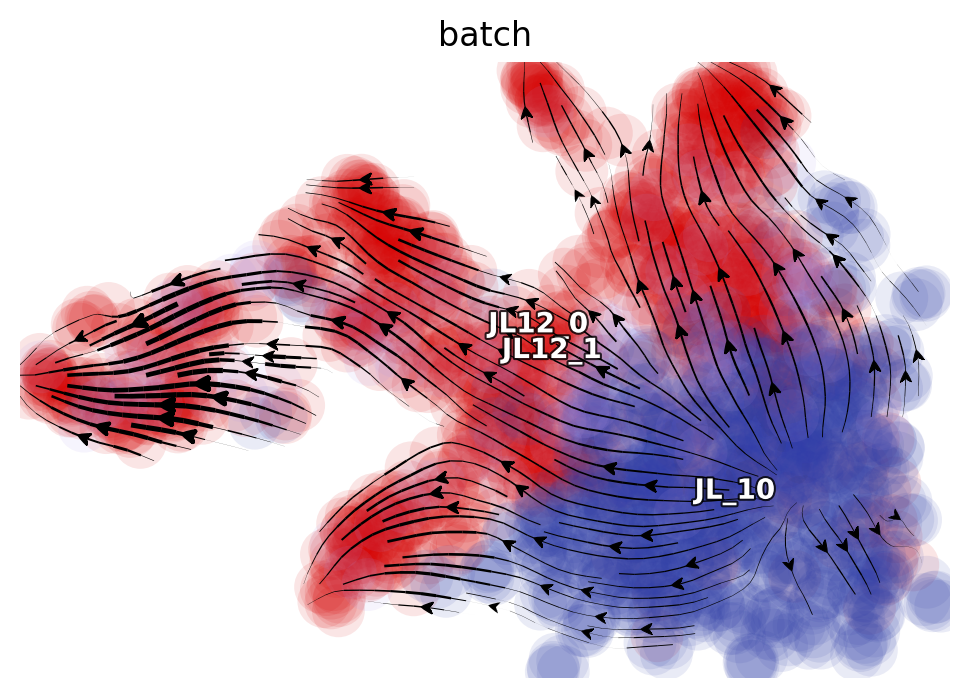

In [18]:
#############################################
# alpha = new / (1 - e^{-rt}) * r
#############################################
new = adata_labeling[:, adata_labeling.var.use_for_pca].layers['M_n']
gamma = adata_labeling[:, adata_labeling.var.use_for_pca].var.gamma
time_3_gamma = adata_labeling[:, adata_labeling.var.use_for_pca].var.time_3_gamma.astype(float)
time_5_gamma = adata_labeling[:, adata_labeling.var.use_for_pca].var.time_5_gamma.astype(float)

t = adata_labeling.obs.time.astype(float)
M_s = M_s[:, adata_labeling.var.use_for_pca]

time_3_cells = adata_labeling.obs.time == 3
time_5_cells = adata_labeling.obs.time == 5

def alpha_minus_gamma_s(new, gamma, t, M_s):
    alpha = new.A.T / (1 - np.exp(- gamma.values[:, None] * t.values[None, :])) * gamma.values[:, None]
    gamma_s = gamma.values[:, None] * M_s.A.T
    alpha_minus_gamma_s = alpha - gamma_s

    return alpha_minus_gamma_s

time_3_tmp = alpha_minus_gamma_s(new[time_3_cells, :], time_3_gamma, t[time_3_cells], M_s[time_3_cells, :])
time_5_tmp = alpha_minus_gamma_s(new[time_5_cells, :], time_5_gamma, t[time_5_cells], M_s[time_5_cells, :])

tmp = adata_labeling.layers['velocity_N'].copy()

valid_tmp = tmp[:, adata_labeling.var.use_for_pca].copy()
valid_tmp[time_3_cells, :] = time_3_tmp.T
valid_tmp[time_5_cells, :] = time_5_tmp.T
tmp[:, adata_labeling.var.use_for_pca] = valid_tmp.copy()

adata_labeling.layers['velocity_alpha_minus_gamma_s'] = tmp.copy()

dyn.tl.cell_velocities(adata_labeling,
                       enforce=True,
                       X=adata_labeling.layers['M_t'],
                       V=adata_labeling.layers['velocity_alpha_minus_gamma_s'],
                       method='cosine',
                       )

chen_paper_genes = ['PLEK', 'HBB', 'MPO', 'SPIB', 'CD79A', 'DNTT', 'CD34', 'CD164', "LMO4", "S100A8", "TGFBI"]
dyn.pl.streamline_plot(
    adata_labeling,
    color=['batch'] + list(adata_dyn.var_names.intersection(chen_paper_genes)),
    ncols=4,
    basis='umap',
)

|-----> 0 genes are removed because of nan velocity values.
Using existing cosine_transition_matrix found in .obsp.
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.4374s]
|-----------> plotting with basis key=X_umap_ori
|-----------> skip filtering batch by stack threshold when stacking color because it is not a numeric type


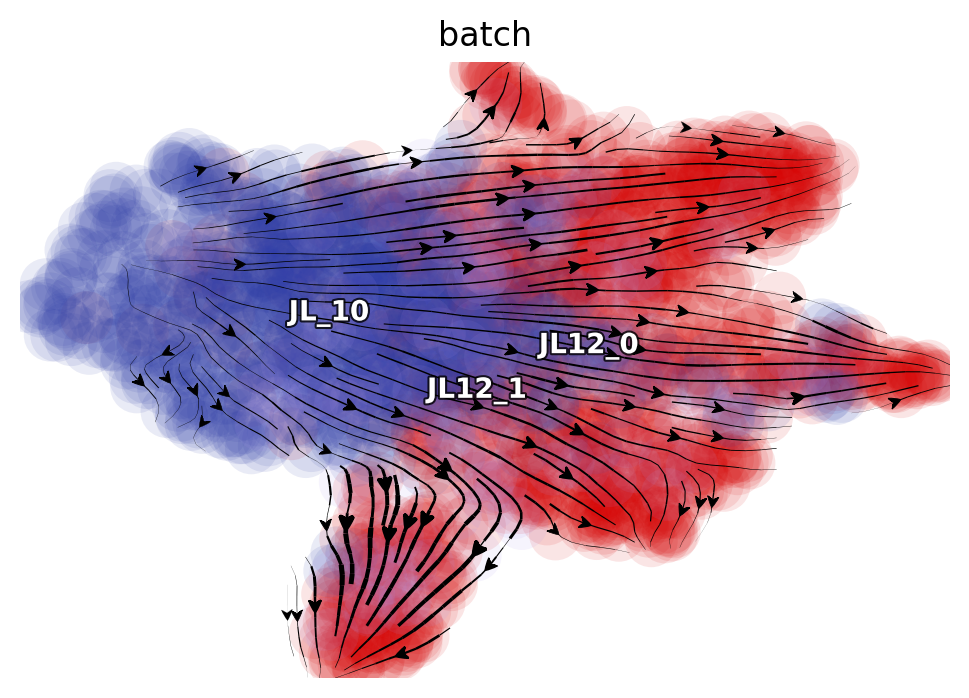

In [20]:
adata_labeling.obsm['X_umap_ori'] = adata_filtered2[adata_labeling.obs_names].obsm['X_umap'].copy()

dyn.tl.cell_velocities(adata_labeling,
                       # X=adata_labeling.layers['M_t'],
                       # V=adata_labeling.layers['alpha_minus_gamma_s'],
                       basis='umap_ori',
                       method='cosine',
                       # enforce=True,
                       )

dyn.pl.streamline_plot(
    adata_labeling,
    color=['batch'], #+ list(adata_dyn.var_names.intersection(chen_paper_genes)),
    ncols=4,
    basis='umap_ori',
)